## Proje 2. Regresyon

### 1. adım: ilgi alanınıza göre bir veri kümesi seçin

#### Ev fiyatlarinin tahmin edilmesi: https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
from pandas.plotting import scatter_matrix
import scipy.stats as stats
from scipy.stats.mstats import winsorize
import seaborn as sns

from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
from statsmodels.tools.eval_measures import mse, rmse

from statsmodels.tsa.stattools import acf

from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet

from scipy.stats import bartlett
from scipy.stats import levene

%matplotlib inline
pd.options.display.float_format = '{:.3f}'.format

pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',200)

import warnings
warnings.filterwarnings(action='ignore')

baslik_font = {'family': 'arial', 'color':'darkred', 'weight':'bold', 'size': 13}
eksen_font  = {'family': 'arial', 'color': 'darkblue','weight': 'bold','size': 10 }

In [3]:
ev = pd.read_csv('house_prices_train.csv')
ev.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
print(ev.shape)

(1460, 81)


In [5]:
ev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

### 2. adım: araştırma sorusu belirleme

#### Bu projede ev fiyatlarinin hangi degiskenler ile tahmin edilecegini bulmaya calisacagim

### 3. adım: veri temizliği

In [7]:
# oncelikleri evlerin insa edilme ve tamir edilme tarihlerinden yillari hesaplayalim

ev['today'] = 2021
ev['ageBuilt'] = ev['today'] - ev['YearBuilt']
ev['ageRemod'] = ev['today'] - ev['YearRemodAdd']

#### bu arada elimizdeki veri setinde kayip degerler oldugunun farkindayim ancak modelim icin o degiskenlerin cok onemli olmadigini dusundugumden dolayi simdilik onlarla herhangi bir islem yapmayacagim

In [9]:
ev.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,today,ageBuilt,ageRemod
count,1460.000,1460.000,1460,1201.000,1460.000,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.000,1460.000,1460.000,1460.000,1460,1460,1460,1460,1452,1452.000,1460,1460,1460,1423,1423,1422,1423,1460.000,1422,1460.000,1460.000,1460.000,1460,1460,1460,1459,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,1460,1460.000,1460,1460.000,770,1379,1379.000,1379,1460.000,1460.000,1379,1379,1460,1460.000,1460.000,1460.000,1460.000,1460.000,1460.000,7,281,54,1460.000,1460.000,1460.000,1460,1460,1460.000,1460.000,1460.000,1460.000
unique,nan,nan,5,nan,nan,2,2,4,4,2,5,3,25,9,8,5,8,nan,nan,nan,nan,6,8,15,16,4,nan,4,5,6,4,4,4,6,nan,6,nan,nan,nan,6,5,2,5,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,4,nan,7,nan,5,6,nan,3,nan,nan,5,5,3,nan,nan,nan,nan,nan,nan,3,4,4,nan,nan,nan,9,6,nan,nan,nan,nan
top,nan,nan,RL,nan,nan,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,nan,nan,nan,nan,Gable,CompShg,VinylSd,VinylSd,None,nan,TA,TA,PConc,TA,TA,No,Unf,nan,Unf,nan,nan,nan,GasA,Ex,Y,SBrkr,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,TA,nan,Typ,nan,Gd,Attchd,nan,Unf,nan,nan,TA,TA,Y,nan,nan,nan,nan,nan,nan,Gd,MnPrv,Shed,nan,nan,nan,WD,Normal,nan,nan,nan,nan
freq,nan,nan,1151,nan,nan,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,nan,nan,nan,nan,1141,1434,515,504,864,nan,906,1282,647,649,1311,953,430,nan,1256,nan,nan,nan,1428,741,1365,1334,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,735,nan,1360,nan,380,870,nan,605,nan,nan,1311,1326,1340,nan,nan,nan,nan,nan,nan,3,157,49,nan,nan,nan,1267,1198,nan,nan,nan,nan
mean,730.500,56.897,NaN,70.050,10516.828,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.099,5.575,1971.268,1984.866,NaN,NaN,NaN,NaN,NaN,103.685,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.640,NaN,46.549,567.240,1057.429,NaN,NaN,NaN,NaN,1162.627,346.992,5.845,1515.464,0.425,0.058,1.565,0.383,2.866,1.047,NaN,6.518,NaN,0.613,NaN,NaN,1978.506,NaN,1.767,472.980,NaN,NaN,NaN,94.245,46.660,21.954,3.410,15.061,2.759,NaN,NaN,NaN,43.489,6.322,2007.816,NaN,NaN,180921.196,2021.000,49.732,36.134
std,421.610,42.301,NaN,24.285,9981.265,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.383,1.113,30.203,20.645,NaN,NaN,NaN,NaN,NaN,181.066,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.098,NaN,161.319,441.867,438.705,NaN,NaN,NaN,NaN,386.588,436.528,48.623,525.480,0.519,0.239,0.551,0.503,0.816,0.220,NaN,1.625,NaN,0.645,NaN,NaN,24.690,NaN,0.747,213.805,NaN,NaN,NaN,125.339,66.256,61.119,29.317,55.757,40.177,NaN,NaN,NaN,496.123,2.704,1.328,NaN,NaN,79442.503,0.000,30.203,20.645
min,1.000,20.000,NaN,21.000,1300.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000,1.000,1872.000,1950.000,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,0.000,0.000,0.000,NaN,NaN,NaN,NaN,334.000,0.000,0.000,334.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,2.000,NaN,0.000,NaN,NaN,1900.000,NaN,0.000,0.000,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,0.000,1.000,2006.000,NaN,NaN,34900.000,2021.000,11.000,11.000
25%,365.750,20.000,NaN,59.000,7553.500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000,5.000,1954.000,1967.000,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,

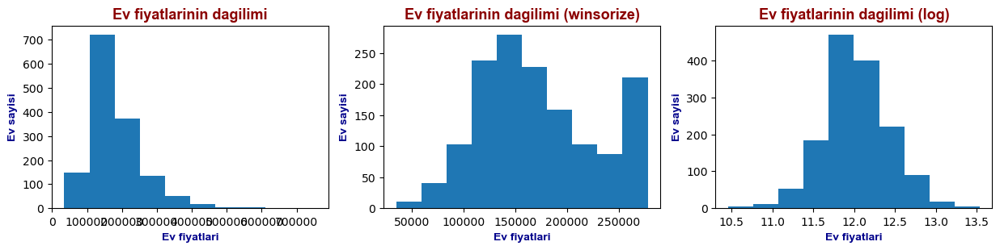

In [10]:
# hedef degiskenimizin dagilimina bakalim

plt.figure(figsize=(15,3), dpi=100)

plt.subplot(1,3,1)
plt.hist(ev.SalePrice)
plt.title('Ev fiyatlarinin dagilimi', fontdict=baslik_font)
plt.xlabel('Ev fiyatlari', fontdict=eksen_font)
plt.ylabel('Ev sayisi', fontdict=eksen_font)

plt.subplot(1,3,2)
plt.hist(winsorize(ev.SalePrice,(0,0.10)))
plt.title('Ev fiyatlarinin dagilimi (winsorize)', fontdict=baslik_font)
plt.xlabel('Ev fiyatlari', fontdict=eksen_font)
plt.ylabel('Ev sayisi', fontdict=eksen_font)

plt.subplot(1,3,3)
plt.hist(np.log(ev.SalePrice))
plt.title('Ev fiyatlarinin dagilimi (log)', fontdict=baslik_font)
plt.xlabel('Ev fiyatlari', fontdict=eksen_font)
plt.ylabel('Ev sayisi', fontdict=eksen_font)
    
plt.show()

In [11]:
# log donusumlu degerler gorsel olarak normal dagilima daha yakin duruyor. Yine de dagilimi daha iyi anlamak icin:

from scipy.stats import jarque_bera
from scipy.stats import normaltest

dagilim_testleri = pd.DataFrame(columns=['ozellik', 'jarque_bera_stats', 'jarque_bera_p_value', 
                                         'normal_stats', 'normal_p_value'])
jb_stats = jarque_bera(np.log(ev.SalePrice))
norm_stats = normaltest(np.log(ev.SalePrice))
dagilim_testleri = dagilim_testleri.append({"ozellik": "SalePrice",
                                            "jarque_bera_stats" : jb_stats[0],
                                            "jarque_bera_p_value" : jb_stats[1],
                                            "normal_stats": norm_stats[0], 
                                            "normal_p_value" : norm_stats[1]}, ignore_index=True)
dagilim_testleri

# p degerleri 0 verdigi icin log donusumlerinin halen daha normal dagilmadigini anliyoruz.

,ozellik,jarque_bera_stats,jarque_bera_p_value,normal_stats,normal_p_value
0,SalePrice,42.767,0.000,25.507,0.000


### 4. adım: veri keşfi

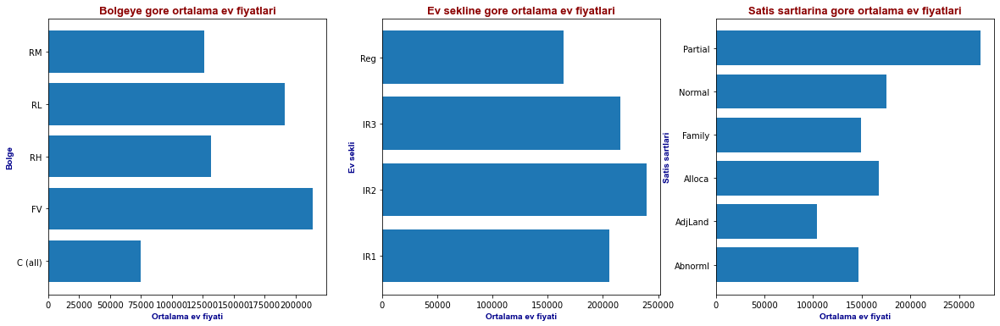

In [12]:
# bazi kategorik degiskenlerimizin hedef degiksen ile iliskilerine bakalim

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
plt.barh(ev.groupby("MSZoning")["SalePrice"].mean().index, 
        ev.groupby("MSZoning")["SalePrice"].mean())
plt.title("Bolgeye gore ortalama ev fiyatlari", fontdict=baslik_font)
plt.xlabel('Ortalama ev fiyati', fontdict=eksen_font)
plt.ylabel('Bolge', fontdict=eksen_font)

plt.subplot(1,3,2)
plt.barh(ev.groupby("LotShape")["SalePrice"].mean().index,
            ev.groupby("LotShape")["SalePrice"].mean())
plt.title("Ev sekline gore ortalama ev fiyatlari", fontdict=baslik_font)
plt.xlabel('Ortalama ev fiyati', fontdict=eksen_font)
plt.ylabel('Ev sekli', fontdict=eksen_font)

plt.subplot(1,3,3)
plt.barh(ev.groupby("SaleCondition")["SalePrice"].mean().index,
         ev.groupby("SaleCondition")["SalePrice"].mean())
plt.title("Satis sartlarina gore ortalama ev fiyatlari", fontdict=baslik_font)
plt.xlabel('Ortalama ev fiyati', fontdict=eksen_font)
plt.ylabel('Satis sartlari', fontdict=eksen_font)

plt.show()

In [13]:
# tum degiskenlerin iliskilerine topluca bakalim. Grafik cok kucuk olsa da bazi degiskenlerin hedef degisken ile
# dogrusal bir iliskisi oldugu goruluyor

sns.pairplot(ev)

In [14]:
# Degiskenlerin arasindaki korelasyona bakalim. Bu asamada sadece sayisal veriler icin olan iliskiyi gorecegiz

ev.corr()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,today,ageBuilt,ageRemod
Id,1.000,0.011,-0.011,-0.033,-0.028,0.013,-0.013,-0.022,-0.050,-0.005,-0.006,-0.008,-0.015,0.010,0.006,-0.044,0.008,0.002,-0.020,0.006,0.007,0.038,0.003,0.027,-0.020,0.000,0.017,0.018,-0.030,-0.000,0.003,-0.047,0.001,0.057,-0.006,0.021,0.001,-0.022,nan,0.013,0.022
MSSubClass,0.011,1.000,-0.386,-0.140,0.033,-0.059,0.028,0.041,0.023,-0.070,-0.066,-0.141,-0.239,-0.252,0.308,0.046,0.075,0.003,-0.002,0.132,0.177,-0.023,0.282,0.040,-0.046,0.085,-0.040,-0.099,-0.013,-0.006,-0.012,-0.044,-0.026,0.008,-0.008,-0.014,-0.021,-0.084,nan,-0.028,-0.041
LotFrontage,-0.011,-0.386,1.000,0.426,0.252,-0.059,0.123,0.089,0.193,0.234,0.050,0.133,0.392,0.457,0.080,0.038,0.403,0.101,-0.007,0.199,0.054,0.263,-0.006,0.352,0.267,0.070,0.286,0.345,0.089,0.152,0.011,0.070,0.041,0.206,0.003,0.011,0.007,0.352,nan,-0.123,-0.089
LotArea,-0.033,-0.140,0.426,1.000,0.106,-0.006,0.014,0.014,0.104,0.214,0.111,-0.003,0.261,0.299,0.051,0.005,0.263,0.158,0.048,0.126,0.014,0.120,-0.018,0.190,0.271,-0.025,0.155,0.180,0.172,0.085,-0.018,0.020,0.043,0.078,0.038,0.001,-0.014,0.264,nan,-0.014,-0.014
OverallQual,-0.028,0.033,0.252,0.106,1.000,-0.092,0.572,0.551,0.412,0.240,-0.059,0.308,0.538,0.476,0.295,-0.030,0.593,0.111,-0.040,0.551,0.273,0.102,-0.184,0.427,0.397,0.548,0.601,0.562,0.239,0.309,-0.114,0.030,0.065,0.065,-0.031,0.071,-0.027,0.791,nan,-0.572,-0.551
OverallCond,0.013,-0.059,-0.059,-0.006,-0.092,1.000,-0.376,0.074,-0.128,-0.046,0.040,-0.137,-0.171,-0.144,0.029,0.025,-0.080,-0.055,0.118,-0.194,-0.061,0.013,-0.087,-0.058,-0.024,-0.324,-0.186,-0.152,-0.003,-0.033,0.070,0.026,0.055,-0.002,0.069,-0.004,0.044,-0.078,nan,0.376,-0.074
YearBuilt,-0.013,0.028,0.123,0.014,0.572,-0.376,1.000,0.593,0.316,0.250,-0.049,0.149,0.391,0.282,0.010,-0.184,0.199,0.188,-0.038,0.468,0.243,-0.071,-0.175,0.096,0.148,0.826,0.538,0.479,0.225,0.189,-0.387,0.031,-0.050,0.005,-0.034,0.012,-0.014,0.523,nan,-1.000,-0.593
YearRemodAdd,-0.022,0.041,0.089,0.014,0.551,0.074,0.593,1.000,0.180,0.128,-0.068,0.181,0.291,0.240,0.140,-0.062,0.287,0.119,-0.012,0.439,0.183,-0.041,-0.150,0.192,0.113,0.642,0.421,0.372,0.206,0.226,-0.194,0.045,-0.039,0.006,-0.010,0.021,0.036,0.507,nan,-0.593,-1.000
MasVnrArea,-0.050,0.023,0.193,0.104,0.412,-0.128,0.316,0.180,1.000,0.265,-0.072,0.114,0.364,0.345,0.175,-0.069,0.391,0.085,0.027,0.277,0.201,0.103,-0.038,0.281,0.249,0.253,0.364,0.373,0.160,0.126,-0.110,0.019,0.061,0.012,-0.030,-0.006,-0.008,0.477,nan,-0.316,-0.180
BsmtFinSF1,-0.005,-0.070,0.234,0.214,0.240,-0.046,0.250,0.128,0.265,1.000,-0.050,-0.495,0.522,0.446,-0.137,-0.065,0.208,0.649,0.067,0.059,0.004,-0.107,-0.081,0.044,0.260,0.153,0.224,0.297,0.204,0.112,-0.102,0.026,0.062,0.140,0.004,-0.016,0.014,0.386,nan,-0.250,-0.128


In [15]:
# iliskili olabilecegini dusundugum kategorik degiskenlerimizi duzenleyelim ve korelasyon matrisimize ekleyelim

ev = pd.get_dummies(data=ev, columns=['MSZoning', 'LotShape','Utilities','SaleCondition','BldgType'])

In [16]:
ev.corr()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,today,ageBuilt,ageRemod,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,Utilities_AllPub,Utilities_NoSeWa,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE
Id,1.000,0.011,-0.011,-0.033,-0.028,0.013,-0.013,-0.022,-0.050,-0.005,-0.006,-0.008,-0.015,0.010,0.006,-0.044,0.008,0.002,-0.020,0.006,0.007,0.038,0.003,0.027,-0.020,0.000,0.017,0.018,-0.030,-0.000,0.003,-0.047,0.001,0.057,-0.006,0.021,0.001,-0.022,nan,0.013,0.022,-0.025,-0.012,0.032,0.031,-0.032,-0.026,-0.038,0.043,0.031,-0.013,0.013,0.007,-0.035,-0.009,0.005,0.016,-0.021,-0.018,-0.023,0.028,-0.003,0.019
MSSubClass,0.011,1.000,-0.386,-0.140,0.033,-0.059,0.028,0.041,0.023,-0.070,-0.066,-0.141,-0.239,-0.252,0.308,0.046,0.075,0.003,-0.002,0.132,0.177,-0.023,0.282,0.040,-0.046,0.085,-0.040,-0.099,-0.013,-0.006,-0.012,-0.044,-0.026,0.008,-0.008,-0.014,-0.021,-0.084,nan,-0.028,-0.041,-0.002,0.171,0.058,-0.343,0.278,-0.113,-0.019,-0.031,0.122,0.023,-0.023,0.005,0.016,0.030,0.001,0.024,-0.051,-0.817,0.445,0.150,0.415,0.525
LotFrontage,-0.011,-0.386,1.000,0.426,0.252,-0.059,0.123,0.089,0.193,0.234,0.050,0.133,0.392,0.457,0.080,0.038,0.403,0.101,-0.007,0.199,0.054,0.263,-0.006,0.352,0.267,0.070,0.286,0.345,0.089,0.152,0.011,0.070,0.041,0.206,0.003,0.011,0.007,0.352,nan,-0.123,-0.089,-0.001,-0.097,-0.048,0.347,-0.325,0.149,0.040,0.216,-0.193,nan,nan,-0.024,-0.037,-0.020,0.017,-0.076,0.127,0.402,-0.023,0.013,-0.347,-0.333
LotArea,-0.033,-0.140,0.426,1.000,0.106,-0.006,0.014,0.014,0.104,0.214,0.111,-0.003,0.261,0.299,0.051,0.005,0.263,0.158,0.048,0.126,0.014,0.120,-0.018,0.190,0.271,-0.025,0.155,0.180,0.172,0.085,-0.018,0.020,0.043,0.078,0.038,0.001,-0.014,0.264,nan,-0.014,-0.014,-0.008,-0.084,-0.033,0.204,-0.174,0.097,0.225,0.257,-0.216,-0.010,0.010,-0.029,-0.013,0.009,-0.011,0.006,0.023,0.164,0.078,-0.015,-0.142,-0.168
OverallQual,-0.028,0.033,0.252,0.106,1.000,-0.092,0.572,0.551,0.412,0.240,-0.059,0.308,0.538,0.476,0.295,-0.030,0.593,0.111,-0.040,0.551,0.273,0.102,-0.184,0.427,0.397,0.548,0.601,0.562,0.239,0.309,-0.114,0.030,0.065,0.065,-0.031,0.071,-0.027,0.791,nan,-0.572,-0.551,-0.132,0.172,-0.065,0.127,-0.196,0.169,0.078,0.042,-0.199,0.002,-0.002,-0.104,-0.042,-0.045,-0.026,-0.143,0.323,0.036,-0.124,-0.158,-0.004,0.129
OverallCond,0.013,-0.059,-0.059,-0.006,-0.092,1.000,-0.376,0.074,-0.128,-0.046,0.040,-0.137,-0.171,-0.144,0.029,0.025,-0.080,-0.055,0.118,-0.194,-0.061,0.013,-0.087,-0.058,-0.024,-0.324,-0.186,-0.152,-0.003,-0.033,0.070,0.026,0.055,-0.002,0.069,-0.004,0.044,-0.078,nan,0.376,-0.074,-0.073,-0.106,-0.001,-0.070,0.158,-0.010,-0.002,-0.058,0.020,-0.010,0.010,-0.046,-0.039,-0.033,-0.024,0.162,-0.152,0.155,0.022,-0.113,-0.017,-0.137
YearBuilt,-0.013,0.028,0.123,0.014,0.572,-0.376,1.000,0.593,0.316,0.250,-0.049,0.149,0.391,0.282,0.010,-0.184,0.199,0.188,-0.038,0.468,0.243,-0.071,-0.175,0.096,0.148,0.826,0.538,0.479,0.225,0.189,-0.387,0.031,-0.050,0.005,-0.034,0.012,-0.014,0.523,nan,-1.000,-0.593,-0.130,0.238,-0.089,0.268,-0.389,0.204,0.079,0.045,-0.235,0.012,-0.012,-0.110,-0.046,-0.010,-0.036,-0.158,0.344,-0.119,-0.206,-0.026,0.087,0.238
YearRemodAdd,-0.022,0.041,0.089,0.014,0.551,0.074,0.593,1.000,0.180,0.128,-0.068,0.181,0.291,0.240,0.140,-0.062,0.287,0.119,-0.012,0.439,0.183,-0.041,-0.150,0.192,0.113,0.642,0.421,0.372,0.206,0.226,-0.194,0.045,-0.039,0.006,-0.010,0.021,0.036,0.507,nan,-0.593,-1.000,-0.107,0.209,-0.066,0.074,-0.162,0.129,0.092,0.044,-0.

### 5. adım: özellik mühendisliği

#### Elimizdeki bilgilere gore modelimizi olusturmaya baslayalim. Degiskenleri belirlerken korelasyon katsayisi 0.5 uzeri olanlari almaya calistim. Sonradan ekledigim kategorik degiskenlerde aciklayici bir katsayi goremedim.

In [17]:
# 1. model icin sectigim degiskenler

Y1 = ev['SalePrice']
X1 = ev[['OverallQual','ageBuilt','ageRemod','TotalBsmtSF','1stFlrSF','GrLivArea','FullBath','TotRmsAbvGrd',
          'GarageCars','GarageArea']]

### 6. adım: test kümesi oluşturma

In [18]:
X1_train,X1_test,Y1_train,Y1_test = train_test_split(X1,Y1,test_size = 0.2, random_state = 465)

print('Egitim kumesindeki gozlem sayisi: {}'.format(X1_train.shape[0]))
print('Test kumesindeki gozlem sayisi: {}'.format(X1_test.shape[0]))

Egitim kumesindeki gozlem sayisi: 1168
Test kumesindeki gozlem sayisi: 292


### 7. adım: ilk regresyon modeli

In [19]:
X1_train = sm.add_constant(X1_train)
results1 = sm.OLS(Y1_train,X1_train).fit()
results1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.772
Model:                            OLS   Adj. R-squared:                  0.770
Method:                 Least Squares   F-statistic:                     390.9
Date:                Mon, 15 Mar 2021   Prob (F-statistic):               0.00
Time:                        08:25:51   Log-Likelihood:                -13950.
No. Observations:                1168   AIC:                         2.792e+04
Df Residuals:                    1157   BIC:                         2.798e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const        -4.977e+04   9812.827     -5.072      0.000    -6.9e+04   -3.05e+04
OverallQual   1.984e+04   1340.584     14.797      0.000    1.72e+04    2.25e+04
ageBuilt      -275.8121     55.419     -4.977      0.000    -384.545    -167.079
ageRemod      -246.0751     70.866     -3.472      0.001    -385.115    -107.035
TotalBsmtSF     13.7012      4.649      2.947      0.003       4.580      22.822
1stFlrSF        14.2736      5.357      2.665      0.008       3.764      24.783
GrLivArea       45.0594      4.706      9.575      0.000      35.826      54.293
FullBath     -4869.7054   2968.844     -1.640      0.101   -1.07e+04     955.215
TotRmsAbvGrd  1643.7793   1250.209      1.315      0.189    -809.151    4096.710
GarageCars    1.189e+04   3450.974      3.445      0.001    5118.729    1.87e+04
GarageArea      17.1388     11.590      1.479      0.139      -5.601      39.878
==============================================================================
Omnibus:                      395.722   Durbin-Watson:                   1.918
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            39733.113
Skew:                          -0.537   Prob(JB):                         0.00
Kurtosis:                      31.553   Cond. No.                     2.12e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.12e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Modelim icin varsayimlarin saglanip saglanmadigina bakacagim

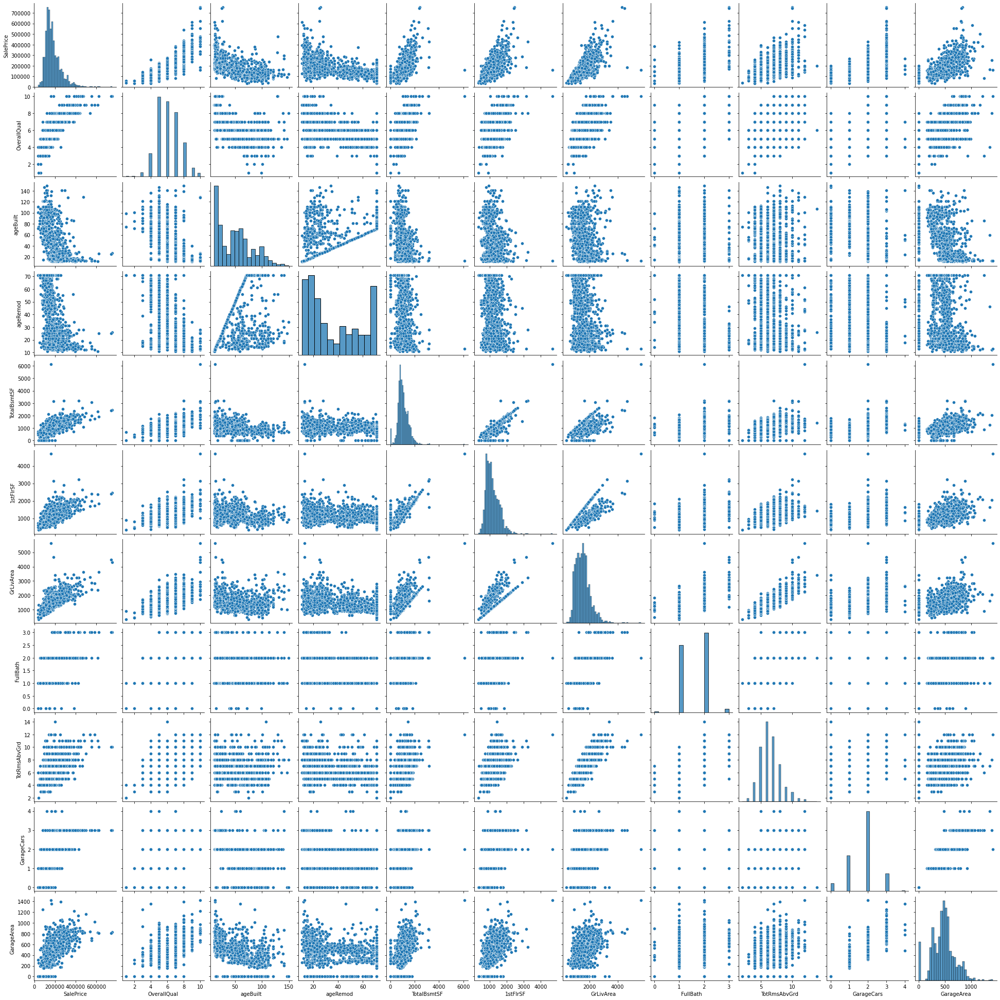

In [20]:
# 1. Katsayilarda modelin dogrusalligi

ev1 = ev[['SalePrice','OverallQual','ageBuilt','ageRemod','TotalBsmtSF','1stFlrSF','GrLivArea','FullBath','TotRmsAbvGrd',
          'GarageCars','GarageArea']]
sns.pairplot(ev1)

In [21]:
# Varsayım 2: Hata terimi ortalamada sıfır olmalıdır

lrm_ev1 = linear_model.LinearRegression()
lrm_ev1.fit(X1_train,Y1_train)
tahmin1 = lrm_ev1.predict(X1_train)
hatalar1 = Y1_train - tahmin1

print("Sicaklik modelinin ortalama hatası : {:.15f}".format(np.mean(hatalar1)))

# modelin hatalarının ortalaması sıfıra cok yakindir. 

Sicaklik modelinin ortalama hatası : -0.000000000016234


In [22]:
# Varsayim 3. Homoscedasticity

bart_stats = bartlett(tahmin1, hatalar1)
lev_stats = levene(tahmin1, hatalar1)

print("Bartlett test değeri : {0:3g} ve p değeri : {1:.21f}".format(bart_stats[0], bart_stats[1]))
print("Levene test değeri   : {0:3g} ve p değeri : {1:.21f}".format(lev_stats[0], lev_stats[1]))

Bartlett test değeri : 407.922 ve p değeri : 0.000000000000000000000
Levene test değeri   : 420.463 ve p değeri : 0.000000000000000000000


#### Her iki testin p değerleri 0.05'ten düşüktür. Bu da hatalarımızın heteroscedastic olduğu anlamına geliyor. NOT: Bu asamada SalePrice hedef degiskeninin log donusumunu alip tekrar modelimi olusturdum ve 3. varsayima baktim. Her ne kadar bu modelin aciklayiciligi daha yuksek de olsa yine de heteroscedastic sonucunu aldim. Asagida:

In [23]:
Y1_log = np.log(ev['SalePrice'])
X1_log = ev[['OverallQual','ageBuilt','ageRemod','TotalBsmtSF','1stFlrSF','GrLivArea','FullBath','TotRmsAbvGrd',
          'GarageCars','GarageArea']]

In [24]:
X1_log_train,X1_log_test,Y1_log_train,Y1_log_test = train_test_split(X1_log,Y1_log,test_size = 0.2, random_state = 465)

print('Egitim kumesindeki gozlem sayisi: {}'.format(X1_log_train.shape[0]))
print('Test kumesindeki gozlem sayisi: {}'.format(X1_log_test.shape[0]))

Egitim kumesindeki gozlem sayisi: 1168
Test kumesindeki gozlem sayisi: 292


In [25]:
X1_log_train = sm.add_constant(X1_log_train)
results1_log = sm.OLS(Y1_log_train,X1_log_train).fit()
results1_log.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.813
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     502.7
Date:                Mon, 15 Mar 2021   Prob (F-statistic):               0.00
Time:                        08:34:38   Log-Likelihood:                 395.11
No. Observations:                1168   AIC:                            -768.2
Df Residuals:                    1157   BIC:                            -712.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           10.9283      0.045    240.333      0.000      10.839      11.017
OverallQual      0.0963      0.006     15.497      0.000       0.084       0.108
ageBuilt        -0.0019      0.000     -7.349      0.000      -0.002      -0.001
ageRemod        -0.0021      0.000     -6.358      0.000      -0.003      -0.001
TotalBsmtSF   6.562e-05   2.15e-05      3.046      0.002    2.34e-05       0.000
1stFlrSF      7.003e-05   2.48e-05      2.821      0.005    2.13e-05       0.000
GrLivArea        0.0002   2.18e-05      9.056      0.000       0.000       0.000
FullBath        -0.0191      0.014     -1.390      0.165      -0.046       0.008
TotRmsAbvGrd     0.0137      0.006      2.363      0.018       0.002       0.025
GarageCars       0.0864      0.016      5.401      0.000       0.055       0.118
GarageArea    2.755e-05   5.37e-05      0.513      0.608   -7.78e-05       0.000
==============================================================================
Omnibus:                      758.254   Durbin-Watson:                   1.862
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            25013.450
Skew:                          -2.479   Prob(JB):                         0.00
Kurtosis:                      25.122   Cond. No.                     2.12e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.12e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [30]:
lrm_ev1_log = linear_model.LinearRegression()
lrm_ev1_log.fit(X1_log_train,Y1_log_train)
tahmin1_log = lrm_ev1_log.predict(X1_log_train)
hatalar1_log = Y1_log_train - tahmin1_log

print("Sicaklik modelinin ortalama hatası : {:.15f}".format(np.mean(hatalar1_log)))

Sicaklik modelinin ortalama hatası : -0.000000000000000


In [31]:
# Varsayim 3. Homoscedasticity
# p degerinde degisiklik olusmadi.

bart_stats = bartlett(tahmin1_log, hatalar1_log)
lev_stats = levene(tahmin1_log, hatalar1_log)

print("Bartlett test değeri : {0:3g} ve p değeri : {1:.21f}".format(bart_stats[0], bart_stats[1]))
print("Levene test değeri   : {0:3g} ve p değeri : {1:.21f}".format(lev_stats[0], lev_stats[1]))

Bartlett test değeri : 579.751 ve p değeri : 0.000000000000000000000
Levene test değeri   : 555.927 ve p değeri : 0.000000000000000000000


#### Kaldigimiz yerden 1. modelimiz uzerinde calismaya devam edelim:

In [32]:
# Varsayim 4. Düşük çoklu doğrusallık/low multicollinearity

ev[['OverallQual','ageBuilt','ageRemod','TotalBsmtSF','1stFlrSF','GrLivArea','FullBath','TotRmsAbvGrd',
          'GarageCars','GarageArea']].corr()

,OverallQual,ageBuilt,ageRemod,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea
OverallQual,1.000,-0.572,-0.551,0.538,0.476,0.593,0.551,0.427,0.601,0.562
ageBuilt,-0.572,1.000,0.593,-0.391,-0.282,-0.199,-0.468,-0.096,-0.538,-0.479
ageRemod,-0.551,0.593,1.000,-0.291,-0.240,-0.287,-0.439,-0.192,-0.421,-0.372
TotalBsmtSF,0.538,-0.391,-0.291,1.000,0.820,0.455,0.324,0.286,0.435,0.487
1stFlrSF,0.476,-0.282,-0.240,0.820,1.000,0.566,0.381,0.410,0.439,0.490
GrLivArea,0.593,-0.199,-0.287,0.455,0.566,1.000,0.630,0.825,0.467,0.469
FullBath,0.551,-0.468,-0.439,0.324,0.381,0.630,1.000,0.555,0.470,0.406
TotRmsAbvGrd,0.427,-0.096,-0.192,0.286,0.410,0.825,0.555,1.000,0.362,0.338
GarageCars,0.601,-0.538,-0.421,0.435,0.439,0.467,0.470,0.362,1.000,0.882
GarageArea,0.562,-0.479,-0.372,0.487,0.490,0.469,0.406,0.338,0.882,1.000


#### Burada gordugum en yuksek iliski 'GarageCars' ve 'GarageArea' arasinda. 'GarageArea' yi modelimden cikaracagim. Zaten OLS uyguladigimizda p degeri de yuksek cikmisti.

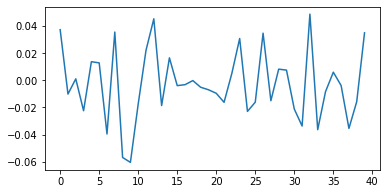

In [34]:
# Varsayim 5. Hata terimleri birbiriyle ilişkisiz olmalıdır

acf_data1 = acf(hatalar1)

plt.figure(figsize=(6,3))
plt.plot(acf_data1[1:])
plt.show()

# modelin hataları arasındaki otokorelasyon çok düşüktür (-0,06 ile 0,04 arasında)

#### Yukaridaki varsayimlarin kontrol edilmesi bolumune baktigimizda modelimizin 3. varsayim (homosedasticity) uymadigini goruyoruz. O bolumde de bahsettigim gibi hedef degiskene log donusumu yaptigimizda da iyi bir sonuc alamadim. Simdilik modelimi bu sekilde birakacagim.

#### Bir de bazi degiskenleri degistirerek ikinci bir model olusturmak istiyorum

In [44]:
# 2. model icin sectigim degiskenler

Y2 = ev['SalePrice']
ev['qual_agebuilt'] = ev.OverallQual * ev.ageBuilt
X2 = ev[['OverallQual','ageBuilt','ageRemod','TotalBsmtSF','1stFlrSF','GrLivArea','FullBath',
          'GarageCars','qual_agebuilt']]

In [45]:
X2_train,X2_test,Y2_train,Y2_test = train_test_split(X2,Y2,test_size = 0.2, random_state = 465)

print('Egitim kumesindeki gozlem sayisi: {}'.format(X2_train.shape[0]))
print('Test kumesindeki gozlem sayisi: {}'.format(X2_test.shape[0]))

Egitim kumesindeki gozlem sayisi: 1168
Test kumesindeki gozlem sayisi: 292


In [46]:
X2_train = sm.add_constant(X2_train)
results2 = sm.OLS(Y2_train,X2_train).fit()
results2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.778
Model:                            OLS   Adj. R-squared:                  0.776
Method:                 Least Squares   F-statistic:                     450.9
Date:                Mon, 15 Mar 2021   Prob (F-statistic):               0.00
Time:                        21:33:12   Log-Likelihood:                -13934.
No. Observations:                1168   AIC:                         2.789e+04
Df Residuals:                    1158   BIC:                         2.794e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          -9.73e+04   1.25e+04     -7.775      0.000   -1.22e+05   -7.27e+04
OverallQual    2.855e+04   1962.593     14.545      0.000    2.47e+04    3.24e+04
ageBuilt        748.8931    176.647      4.239      0.000     402.310    1095.476
ageRemod       -235.9480     69.831     -3.379      0.001    -372.957     -98.939
TotalBsmtSF      10.3415      4.584      2.256      0.024       1.349      19.334
1stFlrSF         15.2310      5.266      2.893      0.004       4.900      25.562
GrLivArea        50.7962      3.374     15.056      0.000      44.177      57.416
FullBath      -6838.0789   2901.100     -2.357      0.019   -1.25e+04   -1146.078
GarageCars     1.549e+04   1995.039      7.765      0.000    1.16e+04    1.94e+04
qual_agebuilt  -170.5107     27.988     -6.092      0.000    -225.423    -115.598
==============================================================================
Omnibus:                      473.938   Durbin-Watson:                   1.892
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            48792.095
Skew:                          -0.884   Prob(JB):                         0.00
Kurtosis:                      34.614   Cond. No.                     2.70e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.7e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [47]:
# iki modelin sonuclarini karsilastirirsak, her ne kadar birbirlerine yakin sonuclar da alsak ikinci modelimiz
# ilkine gore daha iyi gorunuyor.

# 1. model:
R-kare: 0.772
Ayarlanmis R-kare: 0.770
F-statistics: 390.9
AIC: 27920
BIC: 27980
    
# 2. model:
R-kare: 0.778
Ayarlanmis R-kare: 0.776
F-statistics: 450.9
AIC: 27890
BIC: 27940

SyntaxError: invalid syntax (<ipython-input-47-52e7e19f86a9>, line 6)

### 8. adım: modeli kullanarak tahmin yapma

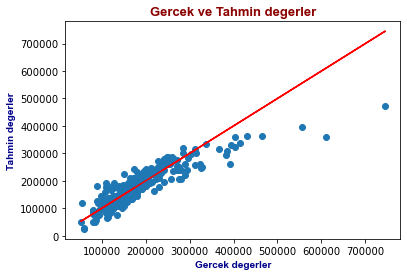

Ortalama mutlak hata (MAE)        : 25864.59919977988
Ortalama kare hata (MSE)          : 1530940218.0563407
Kok ortalama kare hata (RMSE)     : 39127.23115754986
Ortalama mutlak yuzde hata (MAPE) : 14.638888386095896


In [48]:
X2_test = sm.add_constant(X2_test)

Y2_pred = results2.predict(X2_test)

plt.scatter(Y2_test,Y2_pred)
plt.plot(Y2_test,Y2_test,color='red')
plt.xlabel('Gercek degerler', fontdict = eksen_font)
plt.ylabel('Tahmin degerler', fontdict = eksen_font)
plt.title('Gercek ve Tahmin degerler', fontdict = baslik_font)
plt.show()

print('Ortalama mutlak hata (MAE)        : {}'.format(mean_absolute_error(Y2_test, Y2_pred)))
print('Ortalama kare hata (MSE)          : {}'.format(mse(Y2_test, Y2_pred)))
print('Kok ortalama kare hata (RMSE)     : {}'.format(rmse(Y2_test, Y2_pred)))
print('Ortalama mutlak yuzde hata (MAPE) : {}'.format(np.mean(np.abs((Y2_test - Y2_pred)/Y2_test))*100))